# Introduction

- notebook by Jenn Williamson

This notebook imports the csv file that was output from notebook 1.

**NOTE: version 0.11.0 of seaborn is required to run certain plots in this file, so use the code in the third cell in case certain plots are not working (seaborn changed the name of some of their plot functions between the old and new versions)**

The dataframe has some feature engineering on it:
 * Add 7 new columns - one each for the 7 types of protester demands (indicating when a particular demand occurred for a protest) - see section **Review Protest Demand and State Response columns** below for more description
 * Add 7 new columns - one each for the 7 types of state responses (indicating when a particular response occurred for a protest) - see section **Review Protest Demand and State Response columns** below for more description
 * Add a column that indicates whether state violence occured with a protest (whether beatings, shootings, or killings occurred with the protest)
 * Add a column for demands with entries that include all combinations of demands that occurred in the dataframe (using a 7-digit number with 1/0's to indicate the presence of a given type of demand)
 * Add a column for responses with entries that include all combinations of responses that occurred in the dataframe (using a 7-digit number with 1/0's to indicate the presence of a given type of response)

**The modified dataframe is exported for use in other notebooks.**

A separate dataframe is created with key values for further EDA (It's also exported in case it can be used for other notebooks).

EDA includes the following:
 * charts looking at when accommodations occurred by region
 
 * correlation plots seeing if anything seems related

 * plots looking at demand and responses vs region

 * plots looking at demand and responses vs country
 
 * plots looking at demand and responses vs countrycode (since the code relates to region, the groups of region could be easier to pick up)
 
 * Line plots over time showing the following divided by country:
   * number of protests per year
   * how many times state violence occurred per year
   * how many of each type of demand occurred per year
   * how many of each type of response occurred per year

 * Line plots over time showing the following divided by region:
   * number of protests per year
   * how many times state violence occurred per year
   * how many of each type of demand occurred per year
   * how many of each type of response occurred per year
   
 * Line plots over time showing the following for the entire world:
   * number of protests per year
   * how many times state violence occurred per year
   * how many of each type of demand occurred per year
   * how many of each type of response occurred per year

In [36]:
import pandas as pd
import numpy as np
import classification as cl

import matplotlib.pyplot as plt
import seaborn as sns

pd.set_option('display.max_columns',None)

In [37]:
# run to update seaborn so that the new seaborn will work

# pip install seaborn==0.11.0

In [38]:
df = pd.read_csv('../data/base_df.csv')

# Basic Review of the Dataframe

In [39]:
df.head(2)

,Unnamed: 0,id,country,ccode,year,region,protest,protestnumber,startday,startmonth,startyear,endday,endmonth,endyear,protesterviolence,location,participants_category,participants,protesteridentity,protesterdemand1,protesterdemand2,protesterdemand3,protesterdemand4,stateresponse1,stateresponse2,stateresponse3,stateresponse4,stateresponse5,stateresponse6,stateresponse7,sources,notes,years,months,days,total_days,dem_protesterdemand1,dem_protesterdemand2,dem_protesterdemand3,dem_protesterdemand4,resp_stateresponse1,resp_stateresponse2,resp_stateresponse3,resp_stateresponse4,resp_stateresponse5,resp_stateresponse6,resp_stateresponse7
0,0,201990001,Canada,20,1990,North America,1,1,15.0,1.0,1990.0,15.0,1.0,1990.0,0.0,national,999,1000s,unspecified,"political behavior, process",labor wage dispute,999,999,ignore,999,999,999,999,999,999,1. Great Canadian train journeys into history;...,Canada s railway passenger system was finally...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1,201990002,Canada,20,1990,North America,1,2,25.0,6.0,1990.0,25.0,6.0,1990.0,0.0,"Montreal, Quebec",999,1000,unspecified,"political behavior, process",999,999,999,ignore,999,999,999,999,999,999,1. Autonomy s Cry Revived in Quebec The New Yo...,protestors were only identified as young peop...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0


In [40]:
categorical_columns = ['country', 'ccode', 'year', 'region', 'protest', 'protestnumber',
       'protesterviolence',  'participants_category',
       'participants', 'protesterdemand1',
       'protesterdemand2', 'protesterdemand3', 'protesterdemand4',
       'stateresponse1', 'stateresponse2', 'stateresponse3', 'stateresponse4',
       'stateresponse5', 'stateresponse6', 'stateresponse7']

numerical_columns = ['startday', 'startmonth', 'startyear', 'endday', 'endmonth', 'endyear',]

id_columns = ['id','sources','notes', 'protesteridentity', 'location']

In [41]:
for category in categorical_columns:
    print(f'Category is: {category}\n.')
    print(df[category].value_counts())
    print('\n\n\n')

Category is: country
.
United Kingdom           547
France                   527
Ireland                  434
Germany                  360
Kenya                    350
                        ... 
Germany East              11
South Sudan                9
Czechoslovakia             6
Serbia and Montenegro      5
Germany West               2
Name: country, Length: 166, dtype: int64




Category is: ccode
.
200    547
220    527
205    434
255    360
501    350
      ... 
529     11
525      9
315      6
678      4
260      2
Name: ccode, Length: 168, dtype: int64




Category is: year
.
2015    920
2014    830
2016    766
2018    746
2011    739
2013    636
1990    630
2012    604
2017    600
2005    551
1997    546
2000    537
2006    525
1998    511
2010    510
2007    504
2004    499
1999    481
2002    477
1992    475
1996    472
2008    460
1994    457
2001    455
2003    453
2009    439
1991    436
1995    425
1993    390
2019    289
Name: year, dtype: int64




Category is: region

In [42]:
# set up bar_plot function for later use in plotting a group of category columns

def bar_plot(df, columns):
    for category in columns:

        y_names = df[category].value_counts().index
        width = df[category].value_counts()

        plt.figure(figsize=(6,(len(y_names)/4)))
        plt.barh(y_names,width)
        plt.title('Category is: ' + category)
        plt.ylabel('category names')
        plt.xlabel('Number of values in a category')
        plt.show()

# Review Protest Demand and State Response columns

## Create new columns, one each for the 7 types of protester demands, and the 7 types of state responses (so 14 new columns total)

In [43]:
protest_demands = ['protesterdemand1','protesterdemand2', 'protesterdemand3', 'protesterdemand4']

state_responses = ['stateresponse1', 'stateresponse2', 'stateresponse3', 'stateresponse4','stateresponse5', 'stateresponse6', 'stateresponse7']

### The cell below creates two new dataframes - one for demands and one for responses by using a function we created in the classification.py file

This function creates a one-hot encoded column for each of either the 4 protest demand columns or 7 state response colums.  Since there are seven types of protest demands (and state responses) that can occur, rows where no protests occurred (so the demands/responses are 999 - we think these were included for time series analysis, see readme for further discussion), and rows where a few demands/responses were recorded but not the maximum of 4 demands and 7 responses, there were 9 different possible entries in any given cell for demands/responses. In addition, in a few of the categories not all 9 entries occurred out of the entire columns, so when one-hot encoding, the resulting dataframe for that column would have fewer than 9 columns.

To allow the one-hot encoded data frame for each of the demands to be added together (to get the total times that any given demand occurred for a given row), and similarly for the response columns, this function uses concatenation and other techniques so that each dataframe becomes the same size and the output is a dataframe of the nine different demands, and then a dataframe of nine different responses - where the entry in a given column notes how often that particular demand/response occured with a given protest.

This allows someone to easily check whether accommodations occurred by looking at one column, rather than seven different response columns.

Note that a few times, the entries are greater than 1 - indicating that more than one protest demand column or more than one state response column included the same demand/response.  We did not get a chance to look into this, but this could be pursued in the future (on whether this was intentional or a mistake).

In [44]:
df_protest_demands_group = cl.get_dum_cols(df, protest_demands)

df_state_response_group = cl.get_dum_cols(df, state_responses)

### Review what each new dataframe looks like

In [45]:
df_protest_demands_group.sum()

999                            47061.0
labor wage dispute              2146.0
land farm issue                  563.0
police brutality                1001.0
political behavior, process    10192.0
price increases, tax policy     1373.0
removal of politician           1614.0
social restrictions              628.0
.                                874.0
dtype: float64

In [46]:
df_protest_demands_group.head()

,999,labor wage dispute,land farm issue,police brutality,"political behavior, process","price increases, tax policy",removal of politician,social restrictions,.
0,2,1,0,0,1,0,0,0.0,0.0
1,3,0,0,0,1,0,0,0.0,0.0
2,3,0,0,0,1,0,0,0.0,0.0
3,3,0,1,0,0,0,0,0.0,0.0
4,3,0,0,0,1,0,0,0.0,0.0


In [47]:
df_state_response_group.sum()

999                94400.0
accomodation        1503.0
arrests             2022.0
beatings             774.0
crowd dispersal     4439.0
ignore              7977.0
killings             770.0
shootings            869.0
.                   1787.0
dtype: float64

In [48]:
df_state_response_group.head()

,999,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings,.
0,6,0,0,0,0.0,1.0,0,0.0,0.0
1,6,0,0,0,0.0,1.0,0,0.0,0.0
2,6,0,0,0,0.0,1.0,0,0.0,0.0
3,6,1,0,0,0.0,0.0,0,0.0,0.0
4,4,1,1,0,1.0,0.0,0,0.0,0.0


### Create a list of responses that we are interested in (dropping the columns that were either null or missing)

In [49]:
list_of_responses = list(df_state_response_group.drop(columns=['999','.']).columns)
list_of_responses

['accomodation',
 'arrests',
 'beatings',
 'crowd dispersal',
 'ignore',
 'killings',
 'shootings']

In [50]:
list_of_demands = list(df_protest_demands_group.drop(columns=['999','.']).columns)
list_of_demands

['labor wage dispute',
 'land farm issue',
 'police brutality',
 'political behavior, process',
 'price increases, tax policy',
 'removal of politician',
 'social restrictions']

In [51]:
df_protest_demands_group = df_protest_demands_group[list_of_demands].copy()
df_protest_demands_group.columns

Index(['labor wage dispute', 'land farm issue', 'police brutality',
       'political behavior, process', 'price increases, tax policy',
       'removal of politician', 'social restrictions'],
      dtype='object')

In [52]:
df_state_response_group = df_state_response_group[list_of_responses].copy()
df_state_response_group.columns

Index(['accomodation', 'arrests', 'beatings', 'crowd dispersal', 'ignore',
       'killings', 'shootings'],
      dtype='object')

### Create new dataframe that combines the existing dataframe and the two new dataframes that include the 7 demands and 7 responses

In [53]:
df = pd.concat([df, df_protest_demands_group, df_state_response_group], axis = 1)

## Create new column to describe whether the state responded with violence

In [54]:
violent_responses = ['beatings','killings','shootings']

for response in violent_responses:
    df['state_violence'] = df_state_response_group[response]

df['state_violence'].apply(lambda x: 1 if x > 0 else 0)

0        0
1        0
2        0
3        0
4        0
        ..
16358    0
16359    0
16360    0
16361    0
16362    0
Name: state_violence, Length: 16363, dtype: int64

In [55]:
df['state_violence'].sum()

869.0

## Create two new columns - one for demands and one for responses that incorporate all combinations of possible demands/responses that occurred
### Do this by changing the values in category columns, so can add together to create the new demand/response columns

In [56]:
protest_demands = ['protesterdemand1','protesterdemand2', 'protesterdemand3', 'protesterdemand4']

state_responses = ['stateresponse1', 'stateresponse2', 'stateresponse3', 'stateresponse4','stateresponse5', 'stateresponse6', 'stateresponse7']

In [57]:
# Create Dictionaries

protesterdemand_codes = {'political behavior, process':1,
                         'labor wage dispute':10,
                         'price increases, tax policy':100,
                         'removal of politician':1_000,
                         'police brutality':10_000,
                         'land farm issue':100_000,
                         'social restrictions':1_000_000}


stateresponse_codes = {'accomodation':1,
                       'ignore':10,
                       'arrests':100,
                       'crowd dispersal':1_000,
                       'shootings':10_000,
                       'beatings':100_000,
                       'killings':1_000_000}

# turn columns into numbers
# mapping follows Aaron's notes

for col in protest_demands:
    df[col] = df[col].map(protesterdemand_codes)
    
for col in state_responses:
    df[col] = df[col].map(stateresponse_codes)   
    
df[protest_demands] = df[protest_demands].fillna(0)
df[state_responses] = df[state_responses].fillna(0)    

df['protesterdemand'] = df['protesterdemand1'] + df['protesterdemand2'] + df['protesterdemand3'] + df['protesterdemand4']

df['stateresponse'] = df['stateresponse1'] + df['stateresponse2'] + df['stateresponse3'] + df['stateresponse4'] + df['stateresponse5'] + df['stateresponse6'] + df['stateresponse7'] 

In [58]:
df[protest_demands].head()

,protesterdemand1,protesterdemand2,protesterdemand3,protesterdemand4
0,1.0,10.0,0.0,0.0
1,1.0,0.0,0.0,0.0
2,1.0,0.0,0.0,0.0
3,100000.0,0.0,0.0,0.0
4,1.0,0.0,0.0,0.0


In [59]:
df[state_responses].head()

,stateresponse1,stateresponse2,stateresponse3,stateresponse4,stateresponse5,stateresponse6,stateresponse7
0,10.0,0.0,0.0,0.0,0.0,0.0,0.0
1,10.0,0.0,0.0,0.0,0.0,0.0,0.0
2,10.0,0.0,0.0,0.0,0.0,0.0,0.0
3,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,1000.0,100.0,1.0,0.0,0.0,0.0,0.0


## Create new columns with string entries so can do a a bar chart that shows all combinations of demands, and all combinations of responses that occur in the dataset

In [60]:
# Figure out how many different combinations of protester demands there were
df['protesterdemand'].value_counts().sort_index()

0.0          1860
1.0          7744
10.0         1349
11.0          478
100.0         772
             ... 
1011000.0       1
1011001.0       1
1100000.0       7
1100001.0       1
1100011.0       1
Name: protesterdemand, Length: 64, dtype: int64

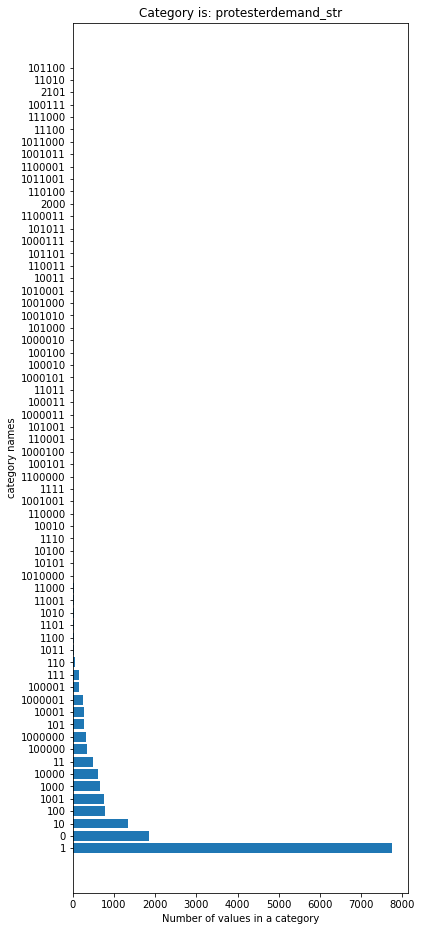

In [61]:
df['protesterdemand_int'] = df['protesterdemand'].apply(lambda x: int(x))
df['protesterdemand_str'] = df['protesterdemand_int'].apply(lambda x: str(x))

bar_plot(df, ['protesterdemand_str'])

In [62]:
# Figure out how many different combinations of state response there were

df['stateresponse'].value_counts().sort_index()

0.0          1878
1.0           867
10.0         7688
11.0          145
100.0         602
             ... 
1111100.0      12
1111101.0       5
1112001.0       1
2000000.0       1
2100100.0       1
Name: stateresponse, Length: 115, dtype: int64

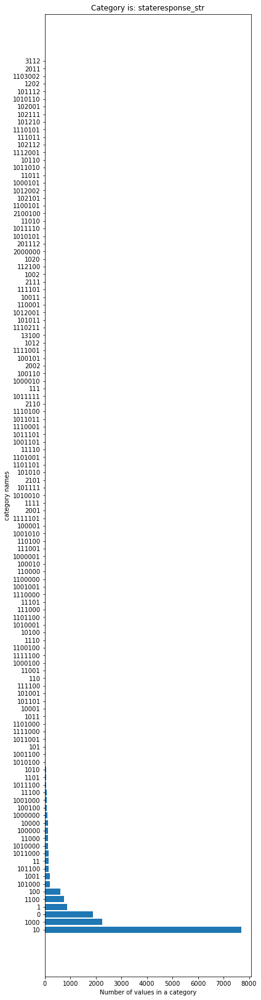

In [63]:
df['stateresponse_int'] = df['stateresponse'].apply(lambda x: int(x))
df['stateresponse_str'] = df['stateresponse_int'].apply(lambda x: str(x))

bar_plot(df, ['stateresponse_str'])

In [64]:
# most categories only appear once (potentially an error where they appear twice)

# Create smaller dataframe for further EDA on the entire world

In [70]:
df_short = df[['id','country', 'ccode', 'year', 'region', 'protest', 'protestnumber',
       'startday', 'startmonth', 'startyear', 'endday', 'endmonth', 'endyear',
       'protesterviolence', 'location', 'participants_category',
       'participants', 'protesteridentity', 'sources',
       'notes', 'total_days', 'protesterdemand',
       'stateresponse','state_violence']].copy()

In [71]:
# combines relevant columns from original dataframe (df_short), 
# with the dummified columns of protest demands (df_protest_demands_group),
# and the dummified columns of state response from above (df_state_response_group)

df_with_categories = pd.concat([df_short, df_protest_demands_group, df_state_response_group], axis = 1)

In [72]:
df_with_categories

,id,country,ccode,year,region,protest,protestnumber,startday,startmonth,startyear,endday,endmonth,endyear,protesterviolence,location,participants_category,participants,protesteridentity,sources,notes,total_days,protesterdemand,stateresponse,state_violence,labor wage dispute,land farm issue,police brutality,"political behavior, process","price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
0,201990001,Canada,20,1990,North America,1,1,15.0,1.0,1990.0,15.0,1.0,1990.0,0.0,national,999,1000s,unspecified,1. Great Canadian train journeys into history;...,Canada s railway passenger system was finally...,0.0,11.0,10.0,0.0,1,0,0,1,0,0,0.0,0,0,0,0.0,1.0,0,0.0
1,201990002,Canada,20,1990,North America,1,2,25.0,6.0,1990.0,25.0,6.0,1990.0,0.0,"Montreal, Quebec",999,1000,unspecified,1. Autonomy s Cry Revived in Quebec The New Yo...,protestors were only identified as young peop...,0.0,1.0,10.0,0.0,0,0,0,1,0,0,0.0,0,0,0,0.0,1.0,0,0.0
2,201990003,Canada,20,1990,North America,1,3,1.0,7.0,1990.0,1.0,7.0,1990.0,0.0,"Montreal, Quebec",999,500,separatist Parti Quebecois,1. Quebec protest after Queen calls for unity ...,"THE Queen, after calling on Canadians to rema...",0.0,1.0,10.0,0.0,0,0,0,1,0,0,0.0,0,0,0,0.0,1.0,0,0.0
3,201990004,Canada,20,1990,North America,1,4,12.0,7.0,1990.0,6.0,9.0,1990.0,1.0,"Montreal, Quebec",999,100s,Mohawk Indians,1. Indians Gather as Siege Intensifies; Armed ...,Canada s federal government has agreed to acq...,55.0,100000.0,1.0,0.0,0,1,0,0,0,0,0.0,1,0,0,0.0,0.0,0,0.0
4,201990005,Canada,20,1990,North America,1,5,14.0,8.0,1990.0,15.0,8.0,1990.0,1.0,"Montreal, Quebec",999,950,local residents,1. Dozens hurt in Mohawk blockade protest The ...,Protests were directed against the state due t...,1.0,1.0,1101.0,0.0,0,0,0,1,0,0,0.0,1,1,0,1.0,0.0,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16358,9102017001,Papua New Guinea,910,2017,Oceania,1,1,15.0,6.0,2017.0,15.0,6.0,2017.0,0.0,Bougainville,50-99,50+,Protesters opposed to renewing the licence of ...,Bougainville imposes moratorium on Panguna mi...,The Bougainville government has enacted an ind...,0.0,100001.0,1.0,0.0,0,1,0,1,0,0,0.0,1,0,0,0.0,0.0,0,0.0
16359,9102017002,Papua New Guinea,910,2017,Oceania,1,2,15.0,7.0,2017.0,15.0,7.0,2017.0,1.0,Mount Hagen,50-99,50+,Protesters opposed to counting irregularities ...,"Violence, chaos and fraud: fraught Papua New ...",Peter O Neill has been reappointed as prime mi...,0.0,1.0,1000.0,0.0,0,0,0,1,0,0,0.0,0,0,0,1.0,0.0,0,0.0
16360,9102017003,Papua New Guinea,910,2017,Oceania,1,3,31.0,10.0,2017.0,31.0,10.0,2017.0,0.0,Lorengau,100-999,About 100,Locals,Refugees dig in as camp closes; Manus Situa...,Refugees on Manus Island were braced for poten...,0.0,1.0,10.0,0.0,0,0,0,1,0,0,0.0,0,0,0,0.0,1.0,0,0.0
16361,9102018000,Papua New Guinea,910,2018,Oceania,0,0,999.0,999.0,999.0,999.0,999.0,999.0,999.0,NaN,999,999,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0.0,0,0,0,0.0,0.0,0,0.0


In [73]:
# set the index to the id since the id won't be used otherwise anyway

df_with_categories.set_index('id', inplace=True)

In [74]:
df_with_categories.to_csv('../data/df_categories.csv',index = False)

# Create dataframe incorporating demands and responses of overall EDA

In [75]:
# create a final data frame of relevant columns
df.columns

Index(['Unnamed: 0', 'id', 'country', 'ccode', 'year', 'region', 'protest',
       'protestnumber', 'startday', 'startmonth', 'startyear', 'endday',
       'endmonth', 'endyear', 'protesterviolence', 'location',
       'participants_category', 'participants', 'protesteridentity',
       'protesterdemand1', 'protesterdemand2', 'protesterdemand3',
       'protesterdemand4', 'stateresponse1', 'stateresponse2',
       'stateresponse3', 'stateresponse4', 'stateresponse5', 'stateresponse6',
       'stateresponse7', 'sources', 'notes', 'years', 'months', 'days',
       'total_days', 'dem_protesterdemand1', 'dem_protesterdemand2',
       'dem_protesterdemand3', 'dem_protesterdemand4', 'resp_stateresponse1',
       'resp_stateresponse2', 'resp_stateresponse3', 'resp_stateresponse4',
       'resp_stateresponse5', 'resp_stateresponse6', 'resp_stateresponse7',
       'labor wage dispute', 'land farm issue', 'police brutality',
       'political behavior, process', 'price increases, tax policy',
  

In [76]:
df.set_index('id', inplace=True)
df.to_csv('../data/df_all.csv', index = False)

# Explore cleaned up dataframe

In [77]:
df_with_categories.head()

,country,ccode,year,region,protest,protestnumber,startday,startmonth,startyear,endday,endmonth,endyear,protesterviolence,location,participants_category,participants,protesteridentity,sources,notes,total_days,protesterdemand,stateresponse,state_violence,labor wage dispute,land farm issue,police brutality,"political behavior, process","price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
201990001,Canada,20,1990,North America,1,1,15.0,1.0,1990.0,15.0,1.0,1990.0,0.0,national,999,1000s,unspecified,1. Great Canadian train journeys into history;...,Canada s railway passenger system was finally...,0.0,11.0,10.0,0.0,1,0,0,1,0,0,0.0,0,0,0,0.0,1.0,0,0.0
201990002,Canada,20,1990,North America,1,2,25.0,6.0,1990.0,25.0,6.0,1990.0,0.0,"Montreal, Quebec",999,1000,unspecified,1. Autonomy s Cry Revived in Quebec The New Yo...,protestors were only identified as young peop...,0.0,1.0,10.0,0.0,0,0,0,1,0,0,0.0,0,0,0,0.0,1.0,0,0.0
201990003,Canada,20,1990,North America,1,3,1.0,7.0,1990.0,1.0,7.0,1990.0,0.0,"Montreal, Quebec",999,500,separatist Parti Quebecois,1. Quebec protest after Queen calls for unity ...,"THE Queen, after calling on Canadians to rema...",0.0,1.0,10.0,0.0,0,0,0,1,0,0,0.0,0,0,0,0.0,1.0,0,0.0
201990004,Canada,20,1990,North America,1,4,12.0,7.0,1990.0,6.0,9.0,1990.0,1.0,"Montreal, Quebec",999,100s,Mohawk Indians,1. Indians Gather as Siege Intensifies; Armed ...,Canada s federal government has agreed to acq...,55.0,100000.0,1.0,0.0,0,1,0,0,0,0,0.0,1,0,0,0.0,0.0,0,0.0
201990005,Canada,20,1990,North America,1,5,14.0,8.0,1990.0,15.0,8.0,1990.0,1.0,"Montreal, Quebec",999,950,local residents,1. Dozens hurt in Mohawk blockade protest The ...,Protests were directed against the state due t...,1.0,1.0,1101.0,0.0,0,0,0,1,0,0,0.0,1,1,0,1.0,0.0,0,0.0


In [78]:
df_with_categories.columns

Index(['country', 'ccode', 'year', 'region', 'protest', 'protestnumber',
       'startday', 'startmonth', 'startyear', 'endday', 'endmonth', 'endyear',
       'protesterviolence', 'location', 'participants_category',
       'participants', 'protesteridentity', 'sources', 'notes', 'total_days',
       'protesterdemand', 'stateresponse', 'state_violence',
       'labor wage dispute', 'land farm issue', 'police brutality',
       'political behavior, process', 'price increases, tax policy',
       'removal of politician', 'social restrictions', 'accomodation',
       'arrests', 'beatings', 'crowd dispersal', 'ignore', 'killings',
       'shootings'],
      dtype='object')

In [79]:
df_with_categories.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16363 entries, 201990001 to 9102019000
Data columns (total 37 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   country                      16363 non-null  object 
 1   ccode                        16363 non-null  int64  
 2   year                         16363 non-null  int64  
 3   region                       16363 non-null  object 
 4   protest                      16363 non-null  int64  
 5   protestnumber                16363 non-null  int64  
 6   startday                     16363 non-null  float64
 7   startmonth                   16363 non-null  float64
 8   startyear                    16363 non-null  float64
 9   endday                       16363 non-null  float64
 10  endmonth                     16363 non-null  float64
 11  endyear                      16363 non-null  float64
 12  protesterviolence            16363 non-null  float64
 13  loc

#  Review how many protests resulted in accommodation around the world 
## trying both with and without incorporating the protest columns (so not including the dummy rows that were used for time series modeling

In [80]:
df_with_categories['protest'].value_counts()

1    14514
0     1849
Name: protest, dtype: int64

In [81]:
df_with_categories['accomodation'][df_with_categories['protest'] == 1].value_counts()

0    13022
1     1481
2       11
Name: accomodation, dtype: int64

In [82]:
df_with_categories['accomodation'].value_counts()

0    14871
1     1481
2       11
Name: accomodation, dtype: int64

In [83]:
df_with_categories[['region','accomodation']].groupby('region').mean()

,accomodation
region,
Africa,0.105785
Asia,0.114545
Central America,0.074380
Europe,0.071063
MENA,0.064539
North America,0.080357
Oceania,0.285714
South America,0.108893


In [84]:
df_with_categories[['region','accomodation']][df_with_categories['protest'] == 1].groupby('region').mean().reset_index()

,region,accomodation
0,Africa,0.126191
1,Asia,0.126548
2,Central America,0.082380
3,Europe,0.077946
4,MENA,0.083029
5,North America,0.090000
6,Oceania,0.368421
7,South America,0.112360


#### Plot of accomodations percentages from when only protests occurred

Text(0, 0.5, '% Protests Receving Accommodations')

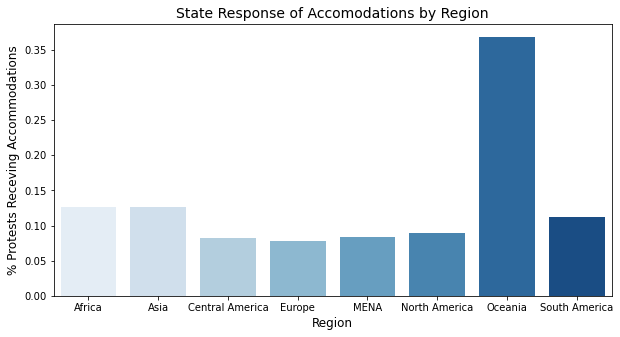

In [85]:
plt.figure(figsize = (10,5))
sns.barplot(data = df_with_categories[['region','accomodation']][df_with_categories['protest'] == 1].groupby('region').mean().reset_index(),
            x = 'region', y = 'accomodation',
            palette = 'Blues'
            );
plt.title('State Response of Accomodations by Region', fontsize=14 )
plt.xlabel('Region', fontsize = 12)
plt.ylabel('% Protests Receving Accommodations', fontsize = 12)

#### Plot of accomodations percentages from all rows (whether or not a protest occurred)

Text(0, 0.5, '% Protests Receving Accommodations')

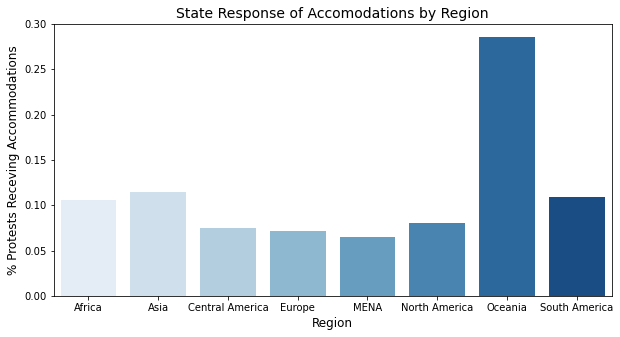

In [86]:
plt.figure(figsize = (10,5))
sns.barplot(data = df_with_categories[['region','accomodation']].groupby('region').mean().reset_index(),
            x = 'region', y = 'accomodation',
            palette = 'Blues'
            );
plt.title('State Response of Accomodations by Region', fontsize=14 )
plt.xlabel('Region', fontsize = 12)
plt.ylabel('% Protests Receving Accommodations', fontsize = 12)

# Analyze dataframe from when accommodations were or were not met

In [87]:
# dataframe of when accommodations met
cols_to_drop_here = ['region','country','ccode','location','participants_category','participants','protesteridentity','sources','notes','protesterdemand', 'stateresponse','year','startyear','endyear']

acc = df_with_categories[df_with_categories['accomodation'] == 1].drop(columns = cols_to_drop_here).copy()
acc.head()

,protest,protestnumber,startday,startmonth,endday,endmonth,protesterviolence,total_days,state_violence,labor wage dispute,land farm issue,police brutality,"political behavior, process","price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
id,,,,,,,,,,,,,,,,,,,,,,,
201990004,1,4,12.0,7.0,6.0,9.0,1.0,55.0,0.0,0,1,0,0,0,0,0.0,1,0,0,0.0,0.0,0,0.0
201990005,1,5,14.0,8.0,15.0,8.0,1.0,1.0,0.0,0,0,0,1,0,0,0.0,1,1,0,1.0,0.0,0,0.0
202000002,1,2,26.0,2.0,26.0,2.0,0.0,0.0,0.0,0,0,1,0,0,0,0.0,1,0,0,0.0,0.0,0,0.0
202016006,1,6,12.0,4.0,12.0,4.0,0.0,0.0,0.0,0,0,0,1,0,0,0.0,1,0,0,0.0,0.0,0,0.0
202018001,1,1,9.0,2.0,9.0,2.0,0.0,0.0,0.0,0,0,0,1,0,0,0.0,1,0,0,0.0,0.0,0,0.0


In [88]:
# when accommodations not met

no_acc = df_with_categories[df_with_categories['accomodation'] == 0].drop(columns = cols_to_drop_here).copy()
no_acc.head()

,protest,protestnumber,startday,startmonth,endday,endmonth,protesterviolence,total_days,state_violence,labor wage dispute,land farm issue,police brutality,"political behavior, process","price increases, tax policy",removal of politician,social restrictions,accomodation,arrests,beatings,crowd dispersal,ignore,killings,shootings
id,,,,,,,,,,,,,,,,,,,,,,,
201990001,1,1,15.0,1.0,15.0,1.0,0.0,0.0,0.0,1,0,0,1,0,0,0.0,0,0,0,0.0,1.0,0,0.0
201990002,1,2,25.0,6.0,25.0,6.0,0.0,0.0,0.0,0,0,0,1,0,0,0.0,0,0,0,0.0,1.0,0,0.0
201990003,1,3,1.0,7.0,1.0,7.0,0.0,0.0,0.0,0,0,0,1,0,0,0.0,0,0,0,0.0,1.0,0,0.0
201990006,1,6,19.0,9.0,19.0,9.0,0.0,0.0,1.0,0,0,1,0,0,0,0.0,0,0,0,1.0,0.0,0,1.0
201991001,1,1,10.0,9.0,17.0,9.0,0.0,7.0,0.0,1,0,0,0,0,0,0.0,0,0,0,0.0,1.0,0,0.0


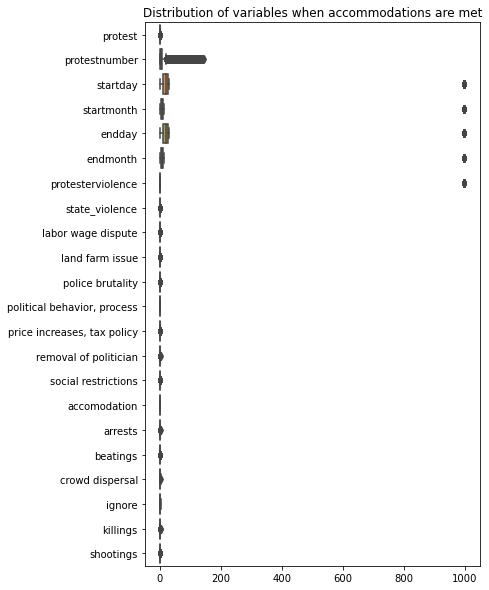

In [89]:
#https://seaborn.pydata.org/generated/seaborn.boxplot.html
    
plt.figure(figsize = (6,10))
sns.boxplot(data=no_acc.drop(columns = ['total_days']), orient = 'h')
plt.title('Distribution of variables when accommodations are met');

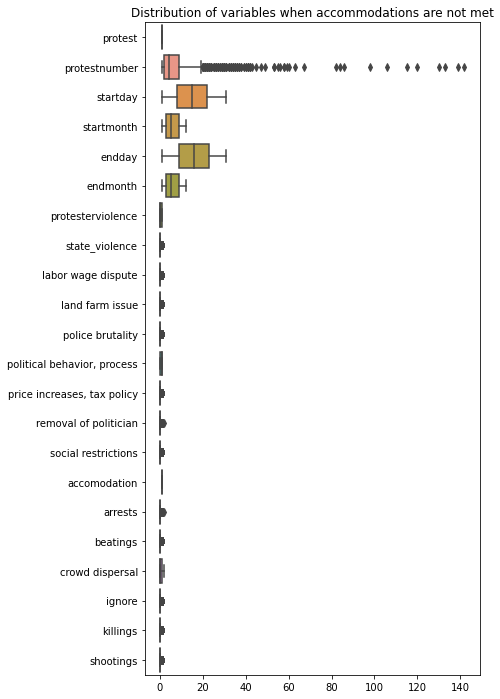

In [90]:
plt.figure(figsize = (6,12))
sns.boxplot(data=acc.drop(columns = ['total_days']), orient = 'h')
plt.title('Distribution of variables when accommodations are not met');

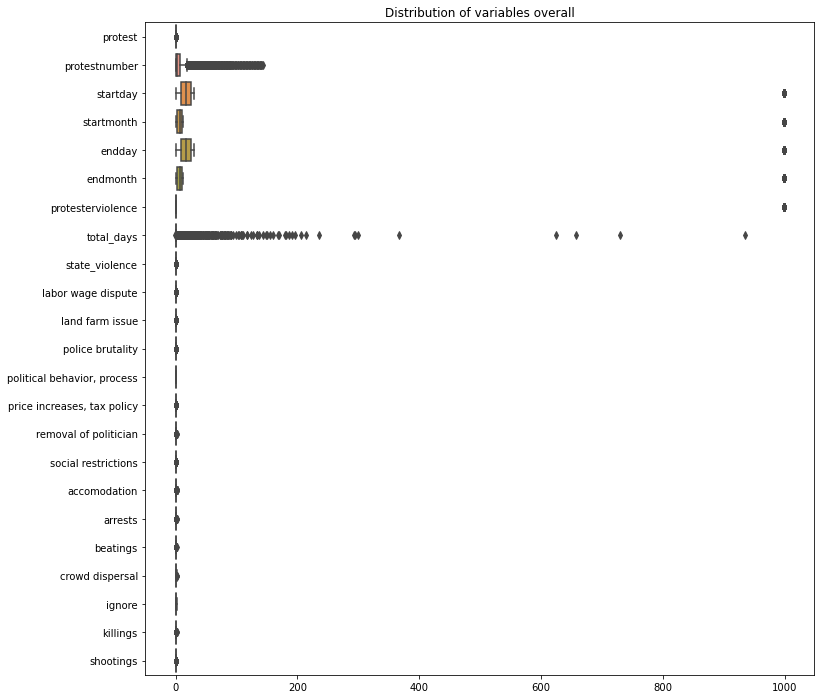

In [91]:
df_acc_test = df_with_categories.drop(columns = ['protesterdemand', 'stateresponse','year','startyear','ccode','region','location','endyear','protesteridentity','sources','notes']).copy()

plt.figure(figsize = (12,12))
sns.boxplot(data=df_acc_test, orient = 'h')
plt.title('Distribution of variables overall');

## Correlation matrix for the general dataset

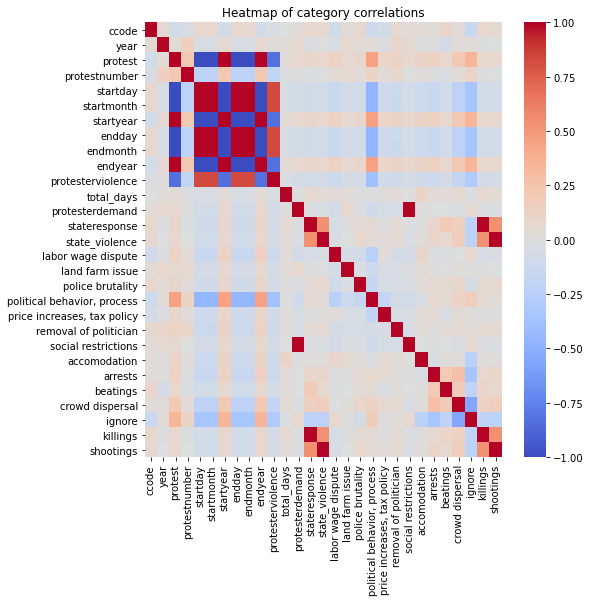

In [92]:
plt.figure(figsize = (8,8))
sns.heatmap(df_with_categories.corr(),
            cmap = 'coolwarm',
            vmin = -1,
            vmax = 1)
plt.title('Heatmap of category correlations');

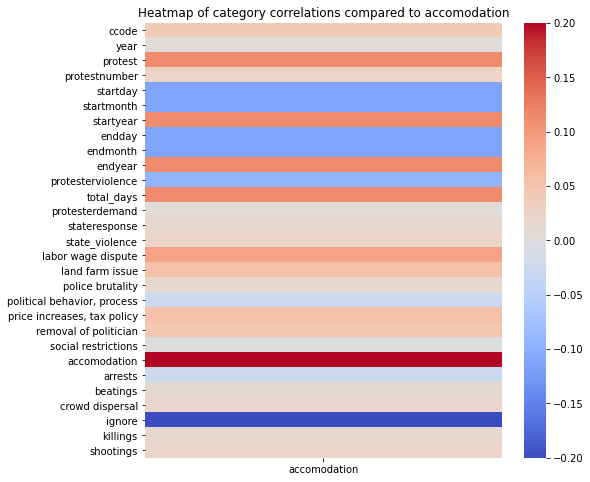

In [93]:
plt.figure(figsize = (8,8))
sns.heatmap(df_with_categories.corr()[['accomodation']],
            cmap = 'coolwarm',
            vmin = -.2,
            vmax = .2)
plt.title('Heatmap of category correlations compared to accomodation');

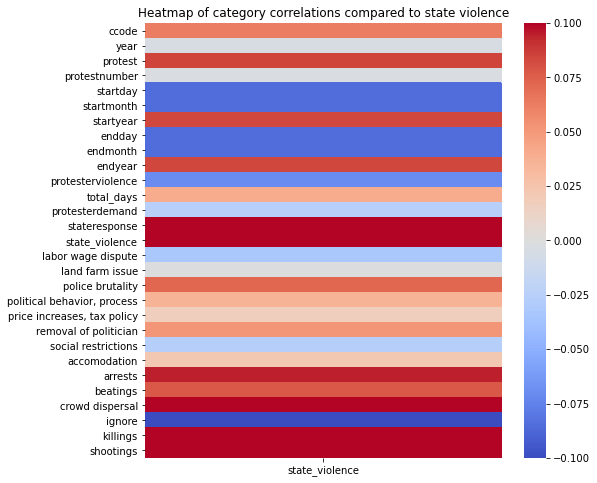

In [94]:
plt.figure(figsize = (8,8))
sns.heatmap(df_with_categories.corr()[['state_violence']],
            cmap = 'coolwarm',
            vmin = -.1,
            vmax = .1)
plt.title('Heatmap of category correlations compared to state violence');

# See if any trends by region

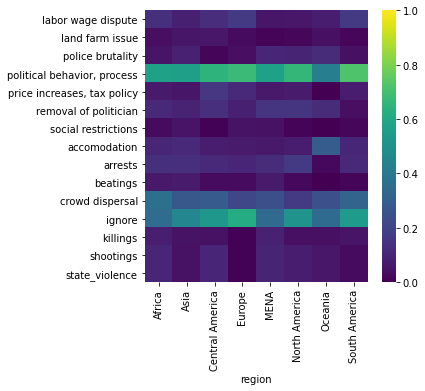

In [95]:
df_region = df_with_categories.groupby('region').mean()[list_of_demands + list_of_responses + ['state_violence']]

plt.figure(figsize = (5,5))
sns.heatmap(df_region.T,
            vmin = 0,
            vmax = 1,
            cmap = 'viridis');

# See if any trends by country name or country code
### Since country code names are related by region

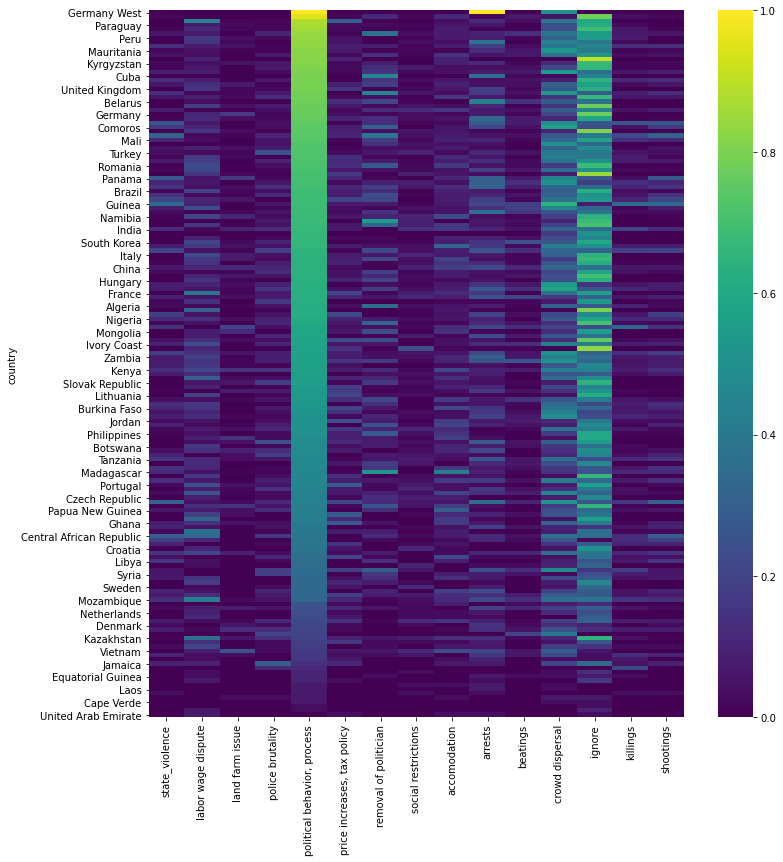

In [96]:
df_country = df_with_categories.groupby('country').mean().sort_values('political behavior, process', ascending = False).drop(columns = ['ccode','year','protest','protestnumber','startday','startmonth','startyear','endday','endmonth','endyear','protesterviolence', 'total_days', 'protesterdemand', 'stateresponse'])

plt.figure(figsize = (12,13))
sns.heatmap(df_country,
            vmin = 0,
            vmax = 1,
            cmap = 'viridis');

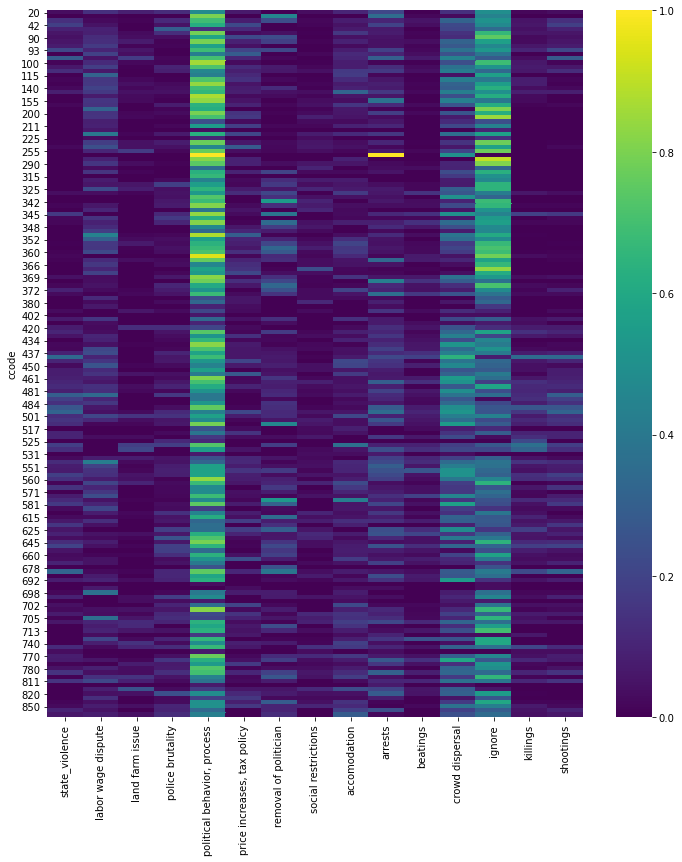

In [97]:
df_country = df_with_categories.groupby('ccode').mean().drop(columns = ['year','protest','protestnumber','startday','startmonth','startyear','endday','endmonth','endyear','protesterviolence', 'total_days', 'protesterdemand', 'stateresponse'])

plt.figure(figsize = (12,13))
sns.heatmap(df_country,
            vmin = 0,
            vmax = 1,
            cmap = 'viridis');

# Plot graphs over time

In [98]:
### Function for multiple groups
# create a function to plot over time

# list_of_items - should be a list of all the areas you want to plot, such as a list of countries
# for each item, there will be a separate plot

# category should match where the list_of_items come from 
# so for categories that are countries, this should be 'country'

# list_to_plot - should be the specific measures you want to plot over time
# for each thing in this list - it will be the legend of the plot

# title -  should be what the output will be per year in whatever item you choose
# for title = 'protests', and list_of_items = 'countries', and list_to_plot='responses'
# the title of the plot will be Protests per year in a particular country

def plot_over_time(list_of_items,key_category, list_to_plot,color_palette, title):

    xticks = list(range(1990,2020,1))
    
    for item in list_of_items:
        df_for_country_bool = (df_with_categories[key_category] == item)
        years_summed = df_with_categories[df_for_country_bool].groupby('year').sum()
        years_summed_just_responses = years_summed[list_to_plot].sum()

        cols_to_drop = list(years_summed_just_responses[years_summed_just_responses == 0].index)
        data = years_summed[list_to_plot].drop(columns = cols_to_drop)

        plt.figure(figsize = (16,2))
        sns.lineplot(data = data, palette = color_palette, linewidth=2.5)
        plt.xticks(xticks,xticks)
        plt.title(f'{title} per year in {item}')

In [99]:
### Function for overall world
# create a function to plot over time

# list_of_items - should be a list of all the areas you want to plot, such as a list of countries
# for each item, there will be a separate plot

# category should match where the list_of_items come from 
# so for categories that are countries, this should be 'country'

# list_to_plot - should be the specific measures you want to plot over time
# for each thing in this list - it will be the legend of the plot

# title -  should be what the output will be per year in whatever item you choose
# for title = 'protests', and list_of_items = 'countries', and list_to_plot='responses'
# the title of the plot will be Protests per year in a particular country

def plot_over_time_combined(list_to_plot,color_palette, title):

    xticks = list(range(1990,2020,1))
    
    years_summed = df_with_categories.groupby('year').sum()
    years_summed_just_responses = years_summed[list_to_plot].sum()

    cols_to_drop = list(years_summed_just_responses[years_summed_just_responses == 0].index)
    data = years_summed[list_to_plot].drop(columns = cols_to_drop)

    plt.figure(figsize = (16,2.5))
    sns.lineplot(data = data, palette = color_palette, linewidth=2.5)
    plt.xticks(xticks,xticks)
    plt.title(f'{title} per year in the world')

In [100]:
demands_palette = {'labor wage dispute':'red',
           'land farm issue': 'hotpink',
           'police brutality': 'blue',
           'political behavior, process': 'green',
           'price increases, tax policy': 'darkorange',
           'removal of politician': 'gold',
           'social restrictions': 'purple'}

response_palette = {'accomodation':'green',
           'arrests': 'darkorange',
           'beatings': 'hotpink',
           'crowd dispersal': 'gold',
           'ignore': 'blue',
           'killings': 'red',
           'shootings': 'purple'}

# Look at countries over time

In [104]:
countries = list(df_with_categories['country'].unique())

<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-105-cf5851ef96c8>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

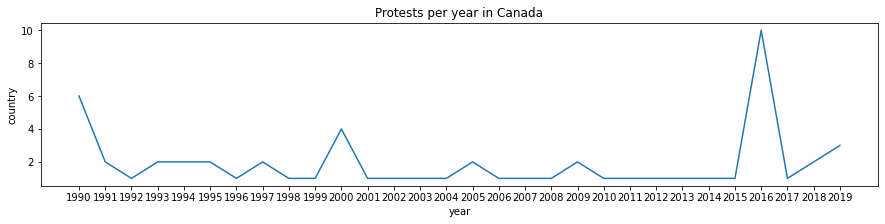

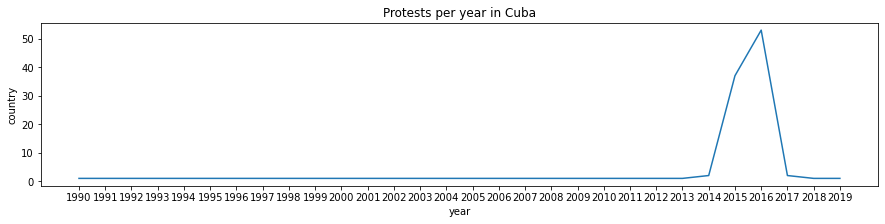

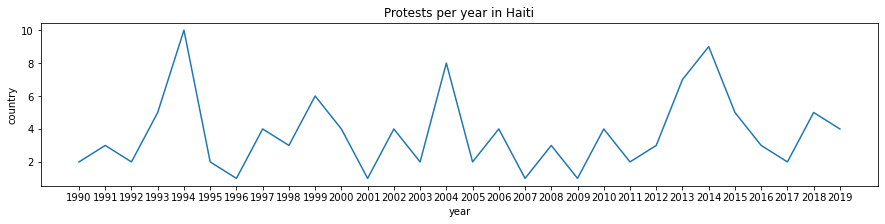

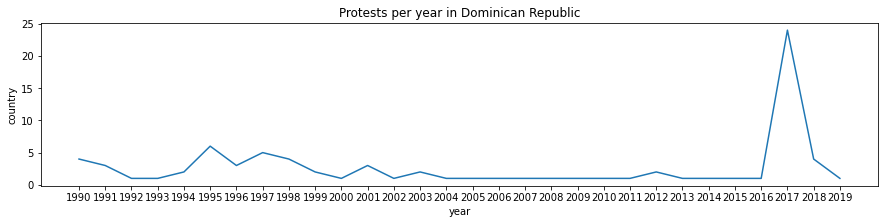

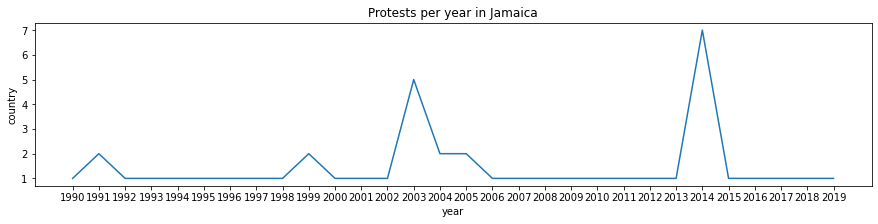

...

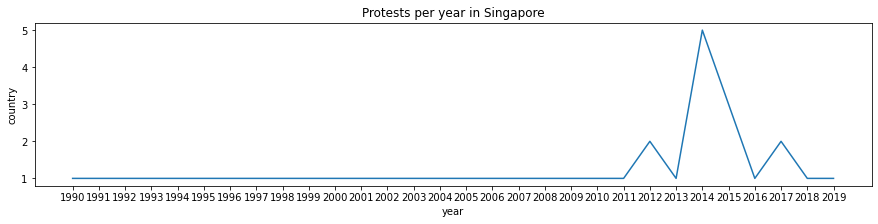

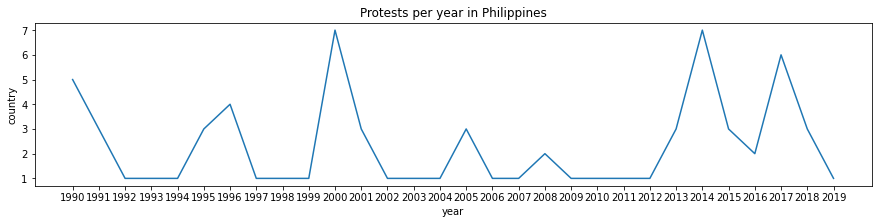

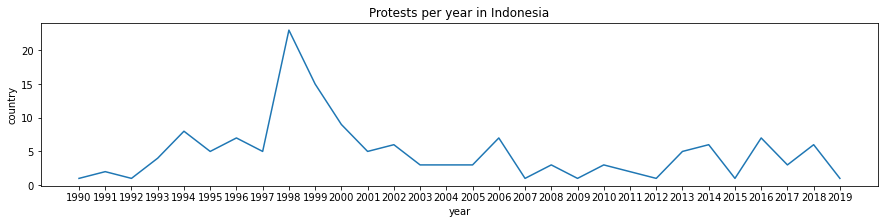

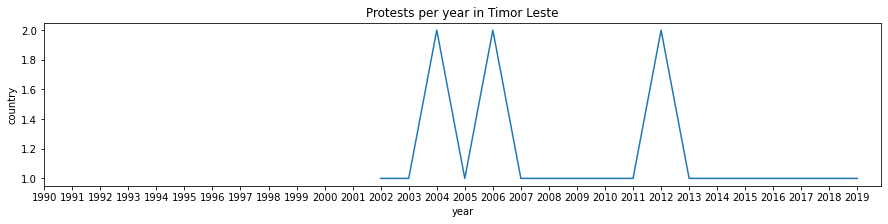

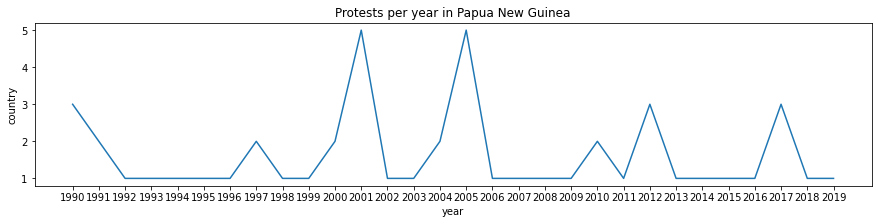

In [105]:
xticks = list(range(1990,2020,1))

for country in countries:
    data = df_with_categories[df_with_categories['country'] == country].groupby('year').count()['country']

    plt.figure(figsize = (15,3))
    sns.lineplot(x = data.index, y = data)
    plt.xticks(xticks,xticks)
    plt.title(f'Protests per year in {country}')

<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (15,3))
<ipython-input-106-7850bb67d724>:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

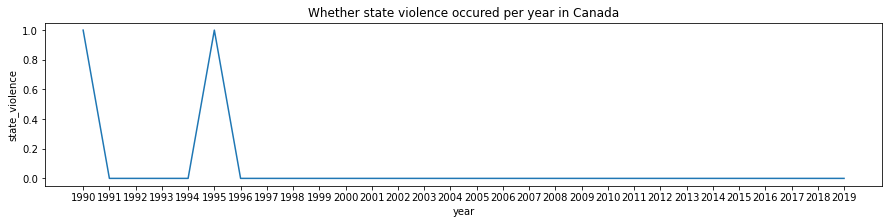

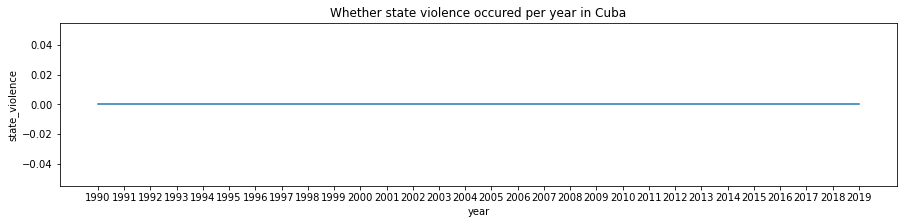

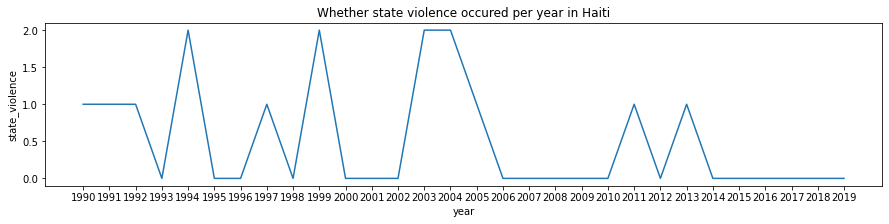

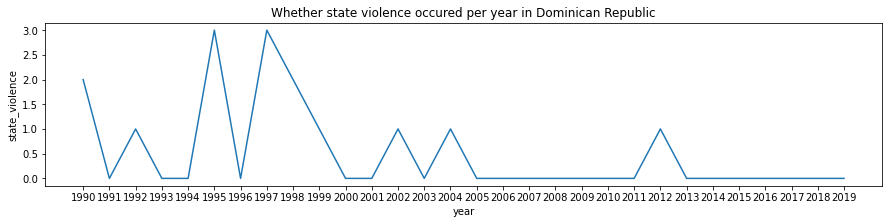

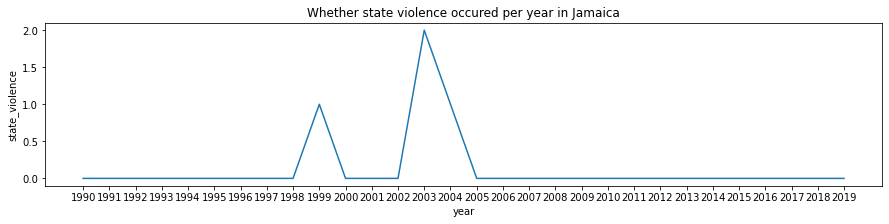

...

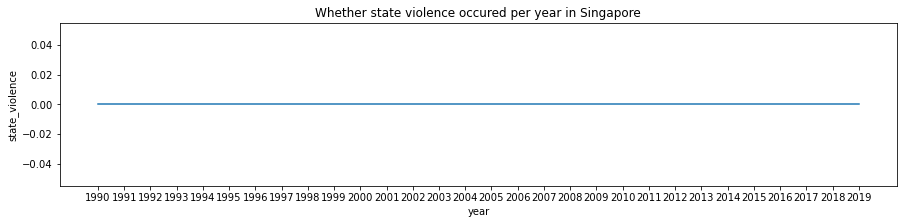

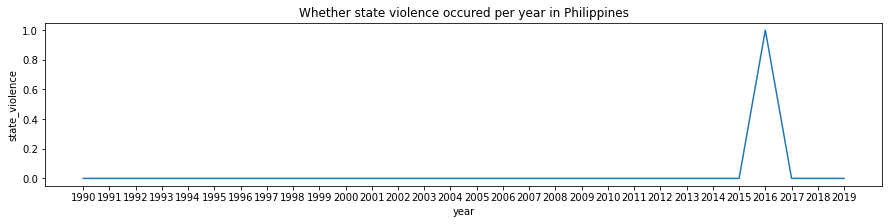

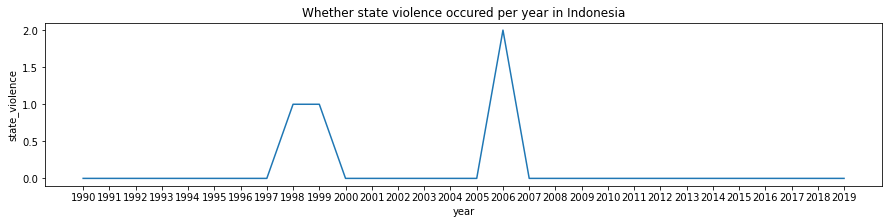

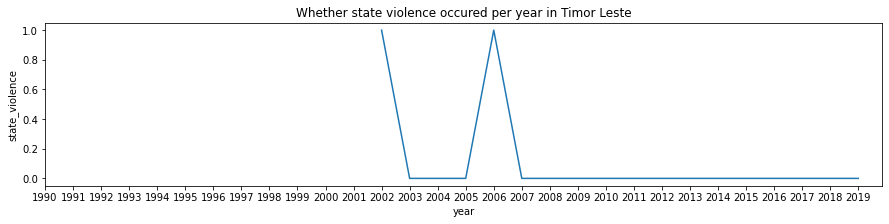

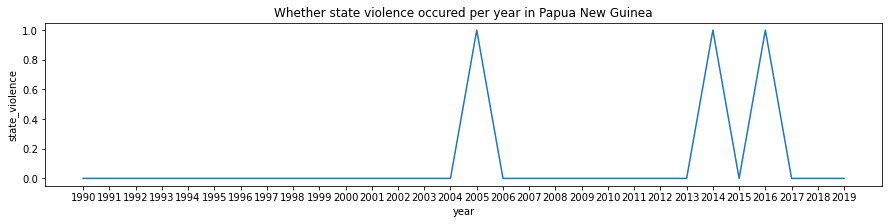

In [106]:
for country in countries:
    data = df[df['country'] == country].groupby('year').sum()['state_violence']

    plt.figure(figsize = (15,3))
    sns.lineplot(x = data.index, y = data)
    plt.xticks(xticks,xticks)
    plt.title(f'Whether state violence occured per year in {country}')

<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

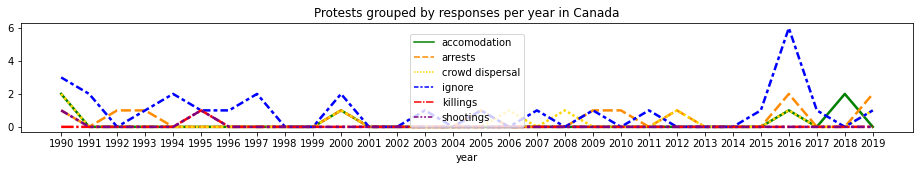

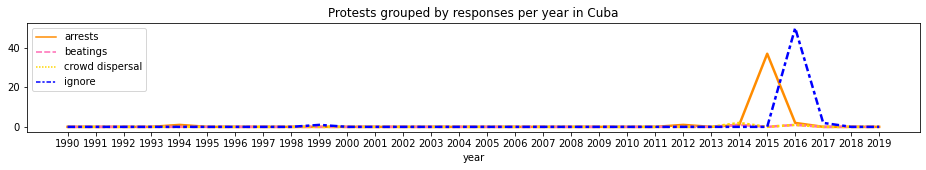

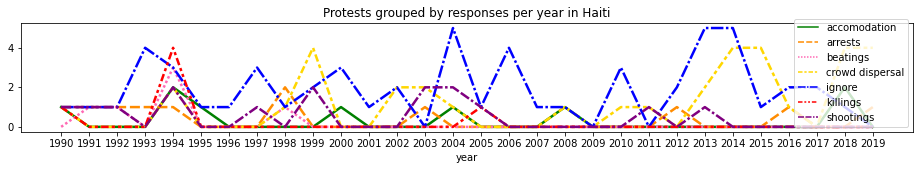

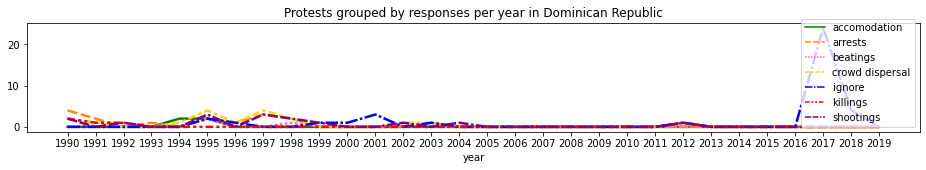

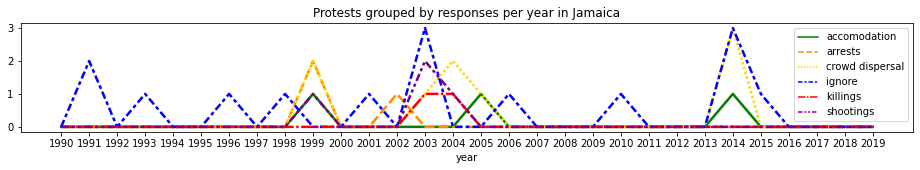

...

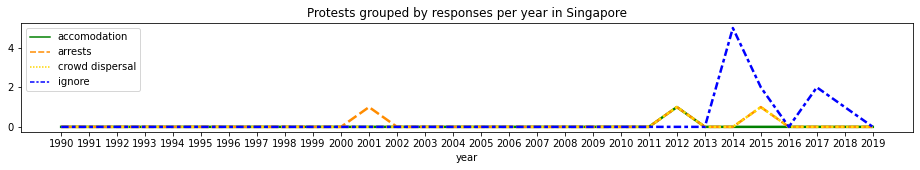

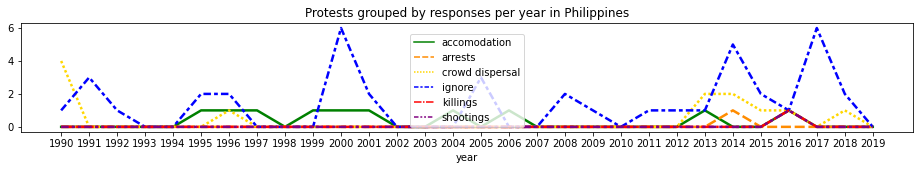

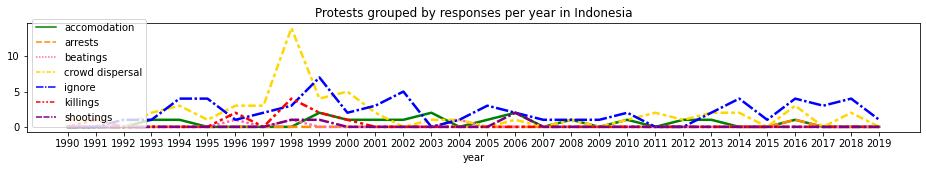

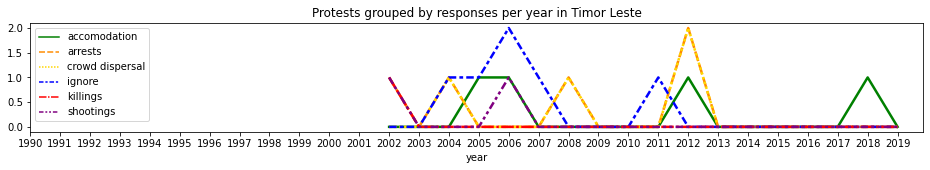

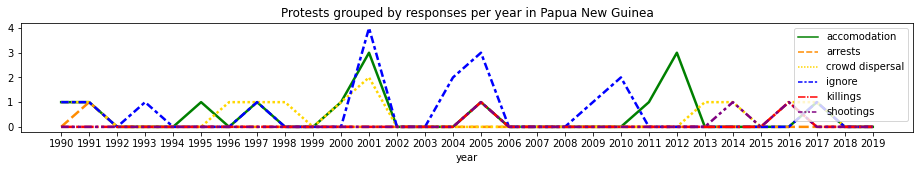

In [107]:
plot_over_time(countries, 'country', list_of_responses, response_palette, 'Protests grouped by responses')

<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (16,2))
<ipython-input-98-9a7b29f66c83>:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = 

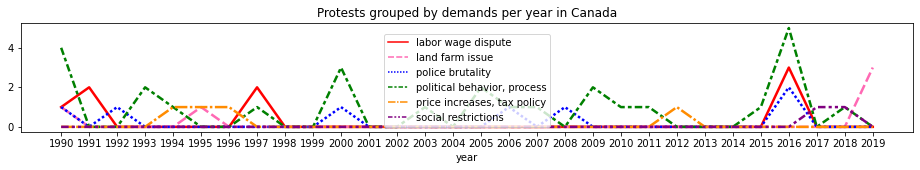

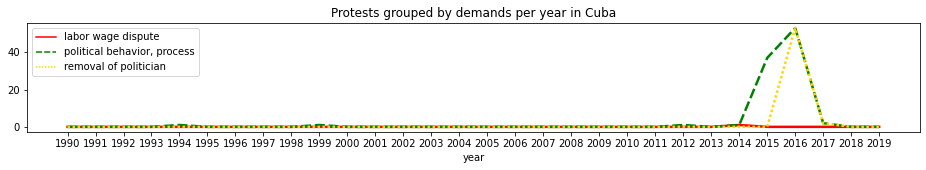

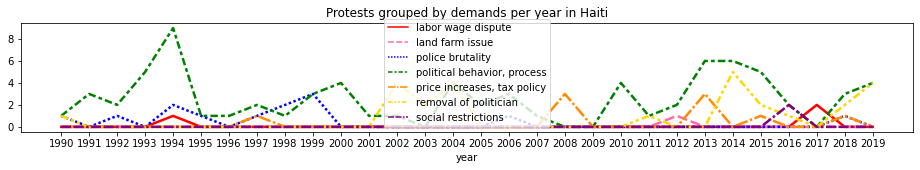

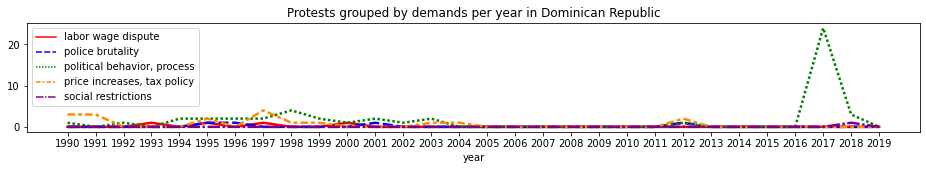

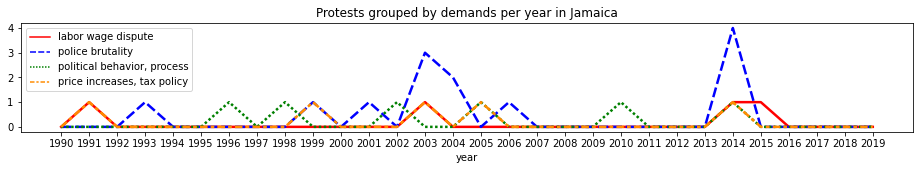

...

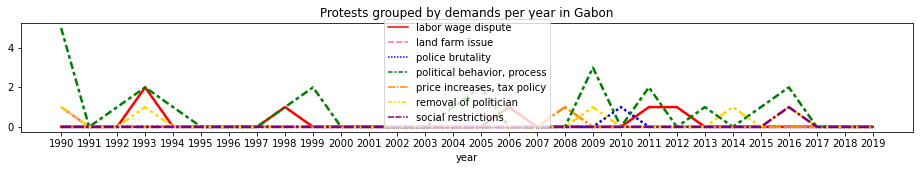

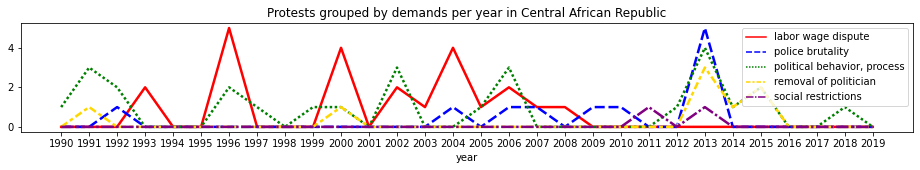

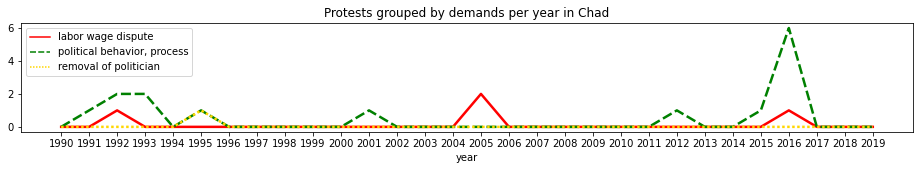

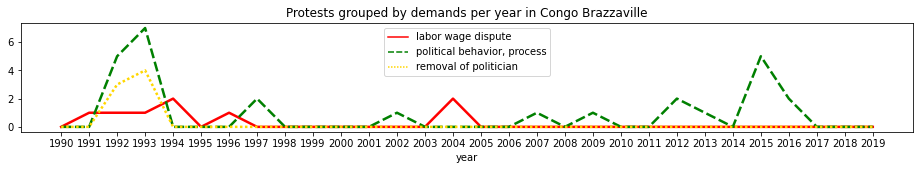

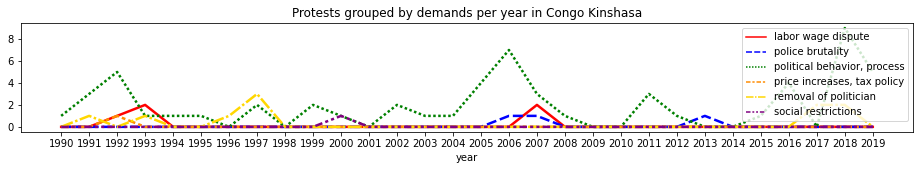

In [ ]:
plot_over_time(countries, 'country', list_of_demands,demands_palette, 'Protests grouped by demands')

# Look at regions over time

In [ ]:
regions = list(df_with_categories['region'].unique())
regions

## Number of protests per year

In [ ]:
for region in regions:
    data = df_with_categories[df_with_categories['region'] == region].groupby('year').count()['region']

    plt.figure(figsize = (15,3))
    sns.lineplot(x = data.index, y = data)
    plt.xticks(xticks,xticks)
    plt.title(f'Protests per year in {region}')

# Whether state violence occurred

In [ ]:
for region in regions:
    data = df[df['region'] == region].groupby('year').sum()['state_violence']

    plt.figure(figsize = (15,3))
    sns.lineplot(x = data.index, y = data)
    plt.xticks(xticks,xticks)
    plt.title(f'Whether state violence occured per year in {region}')

## Responses over time

In [ ]:
plot_over_time(regions, 'region', list_of_responses, response_palette, 'Protests grouped by responses')

## Demands over time

In [ ]:
plot_over_time(regions, 'region', list_of_demands, demands_palette, 'Protests grouped by demands')

# Look at entire world

## Number of protests per year

In [ ]:
data = df_with_categories.groupby('year').count()['country']

plt.figure(figsize = (15,3))
sns.lineplot(x = data.index, y = data)
plt.xticks(xticks,xticks)
plt.title(f'Protests per year in the world')

In [ ]:
data = df.groupby('year').sum()['state_violence']

plt.figure(figsize = (15,3))
sns.lineplot(x = data.index, y = data)
plt.xticks(xticks,xticks)
plt.title(f'Whether state violence occured per year in the world')

## Responses over time

In [ ]:
plot_over_time_combined(list_of_responses,response_palette, 'Protests grouped by Response')

## Demands over time

In [ ]:
plot_over_time_combined(list_of_demands,demands_palette, 'Protests grouped by demand')

# Identify where responses/demands were reported as occuring more than once for a given protest

In [ ]:
list_of_multi_response = []
count = 0

for response in list_of_responses:
    listshort = df_with_categories[list_of_responses][df_with_categories[response] > 1].index
    listshort = list(listshort)
    
    count += len(listshort)
    
    list_of_multi_response.append(listshort)

list_of_multi_response

In [ ]:
list_of_multi_demand = []
count = 0

for demand in list_of_demands:
    listshort = df_with_categories[list_of_demands][df_with_categories[demand] > 1].index
    listshort = list(listshort)
    
    count += len(listshort)
    
    list_of_multi_demand.append(listshort)

list_of_multi_demand